# counting transcripts

### Samuel H. Church and Casey W. Dunn

This document generates several figures that may be helpful in conceptualizing count-space and the sparse nature of single-cell count matrices.

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc

#!pip install matplotlib==3.5.1
import matplotlib
print('matplotlib: {}'.format(matplotlib.__version__))
import matplotlib.pylab as plt
import matplotlib.cm as cm
plt.style.use('classic')
%config InlineBackend.figure_formats = ['svg']
%matplotlib inline
import matplotlib.ticker as ticker

import seaborn as sns

np.random.seed(12345)

matplotlib: 3.5.2


## SIMULATE COUNTING PROCESS

The RNA counting process can be thought of as a probabilistic generative process where the likelihood of observing a transcript is given by its abundance in proportion to other transcripts in the cell.

Each counting process is a walk across natural numbers in a count-space that has n dimensions for n genes. These walks can be visualized as vectors over the space of natural numbers. At very low total counts, these vectors are mostly orthogonal or parallel to one another. As counts increase, cells with different proportional abundances can be distinguished by the direction of their vectors through count space.

In [2]:
# SIMULATE COUNTING PROCESS

def count_walk(prop, n, size=None):
    """Perform a walk in a two-dimensional space of natural numbers,
    with each step adding 1 in one of the dimensions.
    Representing a count space with two genes.
    
    Keyword arguments:
    prop -- real proportional of one of the genes relative to the other, between 0 and 1,
    n    -- number of steps to take (sampling effort)
    size -- total length of the walk space (real total reads), may be longer than n. If 
            None, then size is set to n (default None)
    """
    if size is None:
        size = n
    assert (0<=prop) & (prop<=1), "px is out of range"
    assert size >= n, "the number of steps to take is longer than the walk"
    walk = np.zeros((n,3),dtype=np.uint32)
    samples = np.random.uniform(size=n) < prop 
    for i in range(1,n): 
        walk[i,2] = i
        if samples[i]:                 
            walk[i,0] = walk[i-1,0] + 1
            walk[i,1] = walk[i-1,1]    
        else:                          
            walk[i,0] = walk[i-1,0]    
            walk[i,1] = walk[i-1,1] + 1
    return walk

In [20]:
# RUN SIMULATION

replicates = 5
n = 2000
transcript_proportions = [0.25, 0.6, 0.8]

ap = []
for px in transcript_proportions:
    for r in range(replicates):
        w = count_walk(px, n)
        values = pd.DataFrame(zip([px]*n,[r]*n,w[:,0],w[:,1],w[:,2]),columns=["proportion","replicate","x","y","step"])
        ap.append(values)
df = pd.concat(ap)
df = df.reset_index()

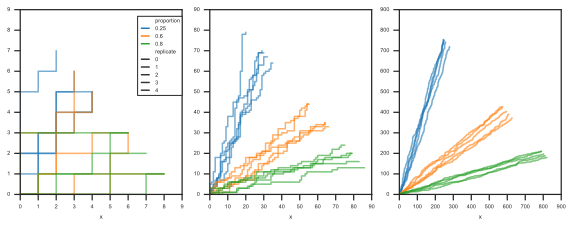

In [21]:
# PLOT SIMULATIONS 

sns.set(font_scale = 0.5);sns.set_style("ticks")

fig, axes = plt.subplots(1,3,figsize=(8,3))
fig.tight_layout()

axes[0] = sns.lineplot(ax = axes[0],
             data=df.loc[df['step']<10],
             x="x",
             y="y",
             hue="proportion",
             style="replicate",
             alpha=0.6,
             dashes=False,
             ci=None,
             sort=False,
             estimator=None,
             palette="tab10")
axes[0].legend(bbox_to_anchor=(1, 0.75), loc=5, borderaxespad=0.)
axes[0].set(ylabel=None)
axes[0].set(ylim=(0,9),xlim=(0,9))
axes[1] = sns.lineplot(ax = axes[1],
             data=df.loc[df['step']<100],
             x="x",
             y="y",
             hue="proportion",
             style="replicate",
             alpha=0.6,
             dashes=False,
             ci=None,
             sort=False,
             estimator=None,
             palette="tab10")
axes[1].get_legend().remove()
axes[1].set(ylabel=None)
axes[1].set(ylim=(0,90),xlim=(0,90))
axes[2] = sns.lineplot(ax = axes[2],
             data=df.loc[df['step']<1000],
             x="x",
             y="y",
             hue="proportion",
             style="replicate",
             alpha=0.6,
             dashes=False,
             ci=None,
             sort=False,
             estimator=None,
             palette="tab10")
axes[2].get_legend().remove()
axes[2].set(ylabel=None)
axes[2].set(ylim=(0,900),xlim=(0,900))


plt.savefig('../../figures_and_panels/count_process_simulation.pdf')


## VISUALIZING COUNTS

By visualizing the raw count matrix, we observe that the vast majority of values are zero or small integers (e.g. 1,2).

In [5]:
import countland as countland

In [6]:
adata = sc.read_10x_mtx(
    '../../data/hg19_3k/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                             # write a cache file for faster subsequent reading

su = countland.countland(adata)
print(su)

initializing countland object...
removing empty cells and genes...

        countland object
        Count matrix has 2700 cells (rows)
         and 16634 genes (columns)
        The fraction of entries that are nonzero is 0.0509
        


In [7]:
ctu = su.counts

sns.set(font_scale=0.5)
sns.set_style("ticks")
sns.set_context("paper")
plt.figure(figsize=(9,3))
cmap = sns.cubehelix_palette(as_cmap=True,gamma=1.5,rot=-.4)
cmap.set_under(color='white')   
sns.heatmap( ctu[0:100,0:400] , linewidth=0.0, cmap = cmap, vmin=0.1)

plt.savefig('../../figures_and_panels/heatmap_count_matrix.pdf')


In [8]:
num1 = np.sum(ctu==1)
num_under5 = np.sum((ctu>0)&(ctu<5))

nonzero = np.count_nonzero(ctu)
total = ctu.shape[0] * ctu.shape[1]

print("percent of counts = 0")
print(100 * np.round((total-nonzero)/total,3))
print("percent of nonzero counts = 1")
print(100 * np.round(num1 / nonzero,3))
print("percent of nonzero counts < 5")
print(100 * np.round(num_under5 / nonzero,3))

percent of counts = 0
94.89999999999999
percent of nonzero counts = 1
69.8
percent of nonzero counts < 5
88.6


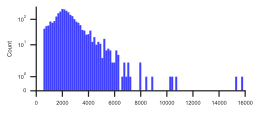

In [9]:
# DISTRIBUTION OF READS ACROSS CELLS

counts_per_cell = np.sum(ctu,axis=1)

sns.set(font_scale = 0.5)
sns.set_style("ticks")


plt.figure(figsize=(3.75,1.5))
g = sns.histplot(x=counts_per_cell,
                 bins=100,
                 color="blue",
                 linewidth=0)
g.set_yscale("symlog")
#g.set(title="Distribution of total reads counted per cell")
sns.despine()

plt.savefig('../figures_and_panels/distribution_of_reads_cell.pdf')


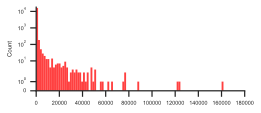

In [10]:
# DISTRIBUTION OF READS ACROSS GENES

counts_per_gene = np.sum(ctu,axis=0)

plt.figure(figsize=(3.75,1.5))
g = sns.histplot(x=counts_per_gene,
                 bins=100,
                 color="red",
                 linewidth=0)
g.set_yscale("symlog")
#g.set(title="Distribution of total reads counted per gene")
sns.despine()
plt.savefig('../figures_and_panels/distribution_of_reads_gene.pdf')


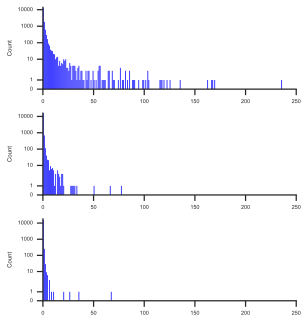

In [11]:
fig, axes = plt.subplots(3,1,figsize=(4,4.5))
fig.tight_layout()

sns.histplot(ax=axes[0], x = ctu[np.argmax(counts_per_cell),:],
             binwidth=1,
             color="blue",
             linewidth=0)
#axes[0].set(title="Cell with the most reads")
axes[0].set_yscale('symlog')
axes[0].yaxis.set_major_formatter(ticker.ScalarFormatter())
axes[0].set_xlim([0,250])

sns.histplot(ax=axes[1], x = ctu[np.argsort(counts_per_cell)[len(counts_per_cell)//2],:],
             binwidth=1,
             color="blue",
             linewidth=0)
#axes[1].set(title="Cell with the median number of reads")
axes[1].set_yscale('symlog')
axes[1].yaxis.set_major_formatter(ticker.ScalarFormatter())
axes[1].set_xlim([0,250])

sns.histplot(ax=axes[2], x = ctu[np.argmin(counts_per_cell),:],
             binwidth=1,
             color="blue",
             linewidth=0)
#axes[2].set(title="Cell with the fewest reads")
axes[2].set_yscale('symlog')
axes[2].yaxis.set_major_formatter(ticker.ScalarFormatter())
axes[2].set_xlim([0,250])
sns.despine()
plt.savefig('../figures_and_panels/distribution_of_reads_ind_cells.pdf')


In [12]:
fig, axes = plt.subplots(3,1,figsize=(3.5,4))
fig.tight_layout()

sns.scatterplot(ax=axes[0],
                x=range(0,ctu.shape[1]),
                y=ctu[np.argmax(counts_per_cell),:],
                color="blue",
                linewidth=0,
                s=4)
#axes[0].set(title="Cell with the most reads")
axes[0].set_yscale('symlog')
axes[0].yaxis.set_major_formatter(ticker.ScalarFormatter())
axes[0].set_xlim([-100,ctu.shape[1]+100])
axes[0].set_ylim([-0.5,10000])
axes[0].set(xticklabels=[])
axes[0].set(xlabel=None)
axes[0].tick_params(bottom=False)

sns.scatterplot(ax=axes[1],
                x=range(0,ctu.shape[1]),
                y=ctu[np.argsort(counts_per_cell)[len(counts_per_cell)//2],:],
                color="blue",
                linewidth=0,
                s=4)
#axes[1].set(title="Cell with the median number of reads")
axes[1].set_yscale('symlog')
axes[1].yaxis.set_major_formatter(ticker.ScalarFormatter())
axes[1].set_xlim([-100,ctu.shape[1]+100])
axes[1].set_ylim([-0.5,250])
axes[1].set(xticklabels=[])
axes[1].set(xlabel=None)
axes[1].tick_params(bottom=False)

sns.scatterplot(ax=axes[2],
                x=range(0,ctu.shape[1]),
                y=ctu[np.argmin(counts_per_cell),:],
                color="blue",
                linewidth=0,
                s=4)
#axes[2].set(title="Cell with the fewest reads")
axes[2].set_yscale('symlog')
axes[2].yaxis.set_major_formatter(ticker.ScalarFormatter())
axes[2].set_xlim([-100,ctu.shape[1]+100])
axes[2].set_ylim([-0.5,250])
axes[2].set(xticklabels=[])
axes[2].set(xlabel=None)
axes[2].tick_params(bottom=False)

sns.despine()
plt.savefig('../figures_and_panels/read_counts_ind_cells.pdf',bbox_inches='tight')

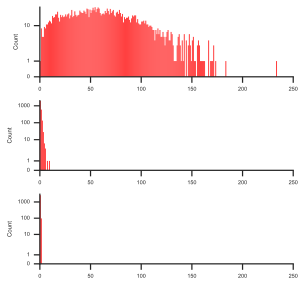

In [13]:
# DISTRIBUTION OF READS ACROSS GENES
fig, axes = plt.subplots(3,1,figsize=(4,4))
fig.tight_layout()

sns.histplot(ax=axes[0], x = ctu[:,np.argmax(counts_per_gene)],
             binwidth=1,
             color="red",
             linewidth=0)
#axes[0].set(title="Gene with the most reads")
axes[0].set_yscale('symlog')
axes[0].yaxis.set_major_formatter(ticker.ScalarFormatter())
axes[0].set_xlim([0,250])

sns.histplot(ax=axes[1], x = ctu[:,np.where(counts_per_gene == 1000)[0][0]],
             binwidth=1,
             color="red",
             linewidth=0)
#axes[1].set(title="Gene with 1000 reads")
axes[1].set_yscale('symlog')
axes[1].yaxis.set_major_formatter(ticker.ScalarFormatter())
axes[1].set_xlim([0,250])

sns.histplot(ax=axes[2], x = ctu[:,np.where(counts_per_gene == 100)[0][0]],
             binwidth=1,
             color="red",
             linewidth=0)
#axes[2].set(title="Gene with 100 reads")
axes[2].set_yscale('symlog')
axes[2].yaxis.set_major_formatter(ticker.ScalarFormatter())
axes[2].set_xlim([0,250])
sns.despine()
plt.savefig('../figures_and_panels/distribution_of_reads_ind_gene.pdf')


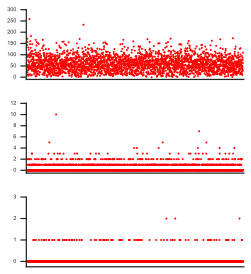

In [14]:
fig, axes = plt.subplots(3,1,figsize=(3.5,4))
fig.tight_layout()

sns.scatterplot(ax=axes[0],
                x=range(0,ctu.shape[0]),
                y=ctu[:,np.argmax(counts_per_gene)],
                color="red",
                linewidth=0,
                s=4)
#axes[0].set(title="Gene with the most reads")
axes[0].set_xlim([-10,ctu.shape[0]+10])
axes[0].set_ylim([-10,300])
axes[0].set(xticklabels=[])
axes[0].set(xlabel=None)
axes[0].tick_params(bottom=False)

sns.scatterplot(ax=axes[1],
                x=range(0,ctu.shape[0]),
                y=ctu[:,np.where(counts_per_gene == 1000)[0][0]],
                color="red",
                linewidth=0,
                s=4)
#axes[1].set(title="Gene with 1000 reads")
axes[1].set_xlim([-10,ctu.shape[0]+10])
axes[1].set_ylim([-0.5,12])
axes[1].set(xticklabels=[])
axes[1].set(xlabel=None)
axes[1].tick_params(bottom=False)

sns.scatterplot(ax=axes[2],
                x=range(0,ctu.shape[0]),
                y=ctu[:,np.where(counts_per_gene == 100)[0][0]],
                color="red",
                linewidth=0,
                s=4)
#axes[2].set(title="Gene with 100 reads")
axes[2].set_xlim([-10,ctu.shape[0]+10])
axes[2].set_ylim([-0.25,3])
axes[2].set(xticklabels=[])
axes[2].yaxis.set_major_locator(ticker.MultipleLocator(1))
axes[2].set(xlabel=None)
axes[2].tick_params(bottom=False)

sns.despine()
plt.savefig('../figures_and_panels/read_counts_ind_gene.pdf',bbox_inches='tight')
